## **Modelos de Detecção**


**O objetivo deste notebook é treinar modelos de aprendizado profundo para identificar e localizar a presença de uma determinada fruta em uma imagem de entrada.**

## **Bibliotecas utilizadas**

In [ ]:
%%capture
!pip install super-gradients
!pip install opendatasets

In [ ]:
import os
import cv2
import json
import shutil
import requests
import numpy as np
import torch
import random
import pathlib
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms, utils
from pathlib import Path
from super_gradients.training import Trainer, dataloaders, models
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import (
    PPYoloEPostPredictionCallback)

## **Baixando dataset do Kaggle com OPENDATASETS**

In [ ]:
import opendatasets as od

od.download('https://www.kaggle.com/datasets/lakshaytyagi01/fruit-detection')
#marcosvmedeiros
#d356a300e335f97bbf3559a47bb0d29f

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: marcosvmedeiros
Your Kaggle Key: ··········


100%|██████████| 501M/501M [00:08<00:00, 65.1MB/s]


## **Configurações**

In [ ]:
class config:
    #trainer params
    CHECKPOINT_DIR = 'checkpoints' #specify the path you want to save checkpoints to
    EXPERIMENT_NAME = 'fruit-detector' #specify the experiment name
    #dataset params
    DATA_DIR = '/content/fruit-detection/Fruits-detection' #parent directory to where data lives
    TRAIN_IMAGES_DIR = 'train/images' #child dir of DATA_DIR where train images are
    TRAIN_LABELS_DIR = 'train/labels' #child dir of DATA_DIR where train labels are
    VAL_IMAGES_DIR = 'valid/images' #child dir of DATA_DIR where validation images are
    VAL_LABELS_DIR = 'valid/labels' #child dir of DATA_DIR where validation labels are
    # if you have a test set
    TEST_IMAGES_DIR = 'test/images' #child dir of DATA_DIR where test images are
    TEST_LABELS_DIR = 'test/labels' #child dir of DATA_DIR where test labels are
    CLASSES = ['Apple', 'Banana', 'Grape', 'Orange', 'Pineapple', 'Watermelon'] #what class names do you have
    NUM_CLASSES = len(CLASSES)
    #dataloader params - you can add whatever PyTorch dataloader params you have
    #could be different across train, val, and test
    DATALOADER_PARAMS={
    'batch_size':16,
    'num_workers':2
    }
    # model params
    MODEL_NAME = 'yolo_nas_s' # choose from yolo_nas_s, yolo_nas_m, yolo_nas_l
    PRETRAINED_WEIGHTS = 'coco' #only one option here: coco

## **Explorando imagens**

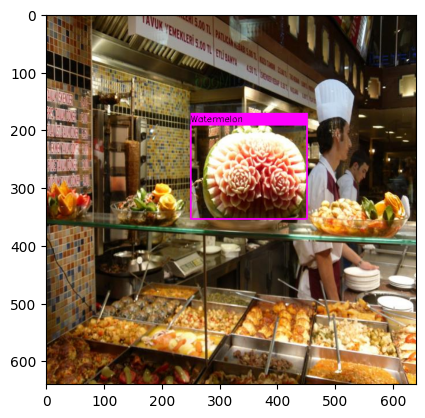

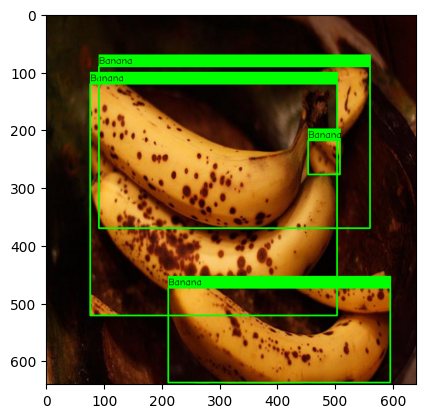

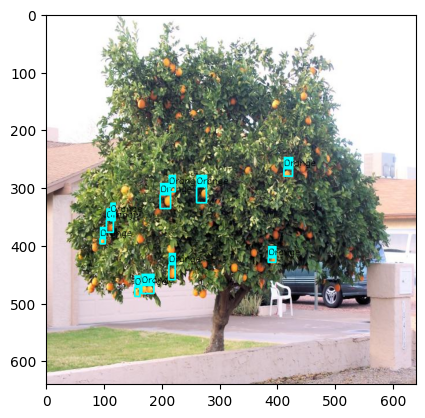

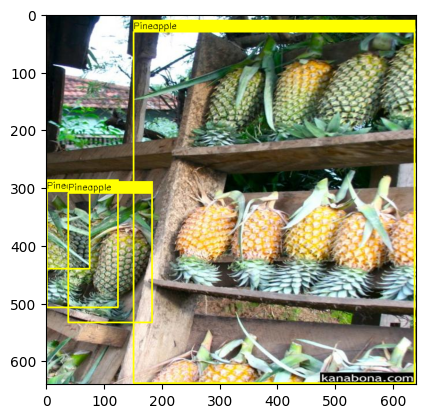

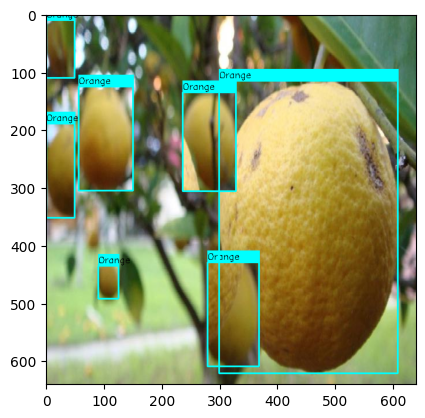

In [ ]:
train_images_dir= os.path.join(config.DATA_DIR, config.TRAIN_IMAGES_DIR)
train_labels_dir= os.path.join(config.DATA_DIR, config.TRAIN_LABELS_DIR)
# Number of images to randomly select
num_images = 5
# Get the list of all image files in the 'images' directory
image_files = [f for f in pathlib.Path(train_images_dir).iterdir() if f.is_file()]
# Shuffle the list of image files
random.shuffle(image_files)

# Select the specified number of image files
selected_image_files = image_files[:num_images]

for selected_image_file in selected_image_files:
    demo_image = selected_image_file
    # Get the corresponding label file
    demo_label = pathlib.Path(train_labels_dir) / f"{selected_image_file.stem}.txt"
    # Load the image using OpenCV's imread function
    image = cv2.imread(str(demo_image))
    # Get the list of class names from the 'data' dictionary
    class_list = config.CLASSES
    # Define a list of colors to be used to draw bounding boxes
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255), (255, 0, 255)]
    # Get the height and width of the image
    height, width, _ = image.shape
    # Create an empty list T
    T = []
    # Open the label file 'demo_label' in read mode and process each line
    with open(demo_label, "r") as file1:
        for line in file1.readlines():
            # Split the line into a list of strings
            split = line.split(" ")
            # Get the class id from the first element of the split list
            class_id = int(split[0])
            # Get the color corresponding to the class id from the 'colors' list
            color = colors[class_id]
            clazz = class_list[class_id]
            # Get the x, y, w, h bounding box coordinates from the split list
            x, y, w, h = float(split[1]), float(split[2]), float(split[3]), float(split[4])
            # Rescale the x, y, w, h values to the size of the image
            box = [int((x - 0.5*w)* width), int((y - 0.5*h) * height), int(w*width), int(h*height)]
            # Draw a rectangle on the image using the 'box' and 'color' values
            cv2.rectangle(image, box, color, 2)
            # Draw a filled rectangle for the class label on the image
            cv2.rectangle(image, (box[0], box[1] - 20), (box[0] + box[2], box[1]), color, -1)
            # Write the class label on the image
            cv2.putText(image, class_list[class_id], (box[0], box[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, .5, (0,0,0))
        # Show the image using matplotlib
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        # Optionally resize the image (commented out in code)
        image = cv2.resize(image, (600, 600))
        plt.show()

## **Fine-tuning YOLONAS**

### **Trainer**

A primeira coisa que você precisa definir no SuperGradients é o trainer.

O trainer é responsável pelo treinamento, avaliação, salvamento de checkpoints, etc.
Há dois argumentos importantes para o trainer:

1) `ckpt_root_dir` - este é o diretório onde os resultados de todos os seus experimentos serão salvos.

2)`experiment_name` - todos os pontos de verificação, logs e tensorboards serão salvos em um diretório com o nome que você especificar aqui.

In [ ]:
trainer = Trainer(experiment_name=config.EXPERIMENT_NAME, ckpt_root_dir=config.CHECKPOINT_DIR)

### **Datasets e DataLoaders**

SuperGradients é totalmente compatível com Datasets e Dataloaders do PyTorch, então você pode usar seus dataloaders como estão.

Existem vários conjuntos de dados bem conhecidos para detecção de objetos, como:

- COCO
- Pascal
- YOLODarkNet
- YOLOv5

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.TRAIN_IMAGES_DIR,
        'labels_dir': config.TRAIN_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.VAL_IMAGES_DIR,
        'labels_dir': config.VAL_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.TEST_IMAGES_DIR,
        'labels_dir': config.TEST_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

[2023-12-09 22:25:22] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 7108/7108 [00:01<00:00, 4996.42it/s]
[2023-12-09 22:25:23] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 914/914 [00:00<00:00, 3313.37it/s]
[2023-12-09 22:25:24] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.


### Visualizando como ficam algumas imagens após os aumentos

Indexing dataset annotations: 100%|██████████| 457/457 [00:00<00:00, 3451.57it/s]


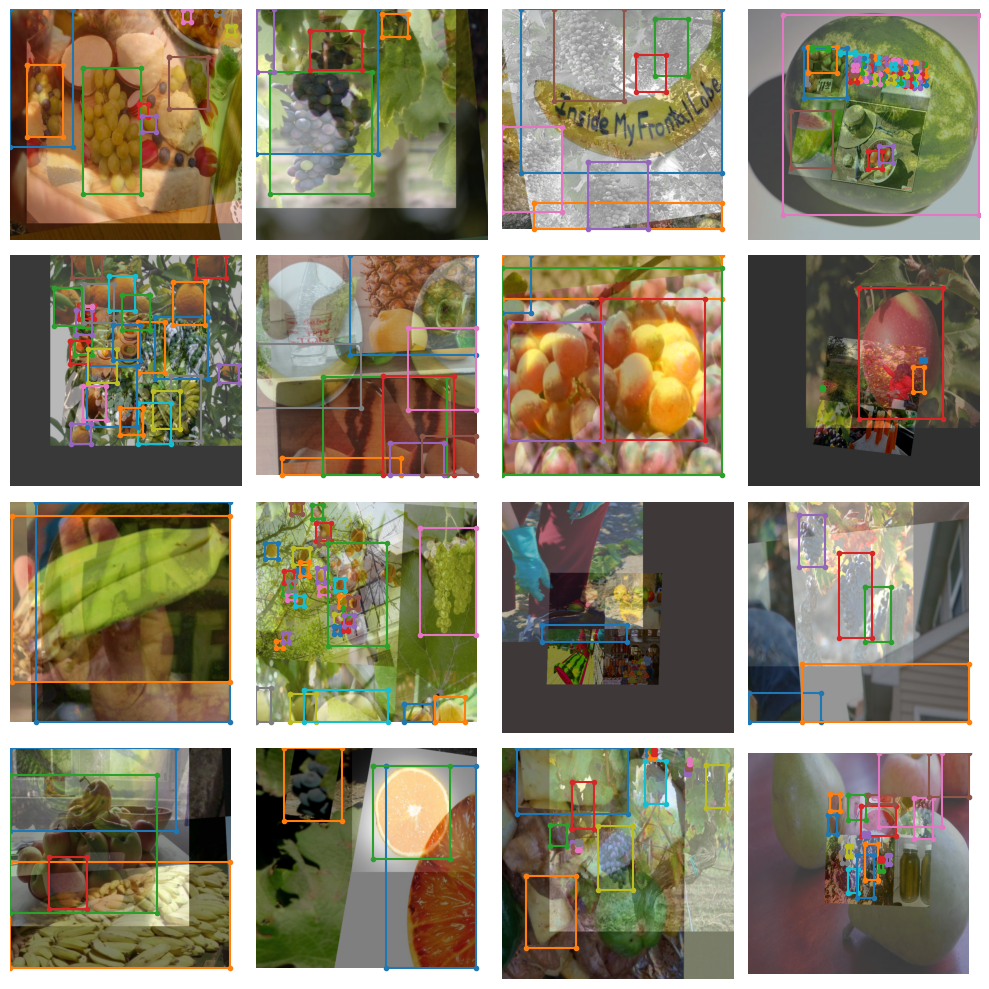

In [ ]:
train_data.dataset.plot()

## **Instanciando o modelo**

Abaixo está como instanciar o modelo para ajuste fino. Observe que você precisa adicionar o argumento `num_classes` aqui.

Lembre-se, para este tutorial, você está usando `yolo_nas_l`, mas o SuperGradients tem mais duas variações do YOLONAS disponíveis para você: `yolo_nas_s` e `yolo_nas_m`.

In [ ]:
model = models.get(config.MODEL_NAME,
                   num_classes=config.NUM_CLASSES,
                   pretrained_weights=config.PRETRAINED_WEIGHTS
                   )

[2023-12-09 22:25:48] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:00<00:00, 90.5MB/s]
[2023-12-09 22:25:49] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_s


## **Definindo métricas e parâmetros de treinamento**



Há alguns argumentos obrigatórios que você deve definir para os parâmetros de treinamento

- `max_epochs` - Número máximo de épocas de treinamento

- `loss` - a função de perda

- `optimizer` - o otimizador

- `train_metrics_list` - Métricas para registrar durante o treinamento

- `valid_metrics_list` - Métricas para registrar com o conjunto de validação

- `metric_to_watch` - Métrica pela qual o checkpoint do modelo será salvo

Pode escolher entre uma variedade de otimizadores, como: Adam, AdamW, SGD, Lion ou RMSProps. Se você optar por alterar os parâmetros padrão desses otimizadores, passe-os para optimizer_params.







In [ ]:
train_params = {
    # ENABLING SILENT MODE
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-5,
    "lr_warmup_epochs": 5,
    "initial_lr": 3e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 10,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=config.NUM_CLASSES,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=config.NUM_CLASSES,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

## **Treinamento do modelo**

Depois que:

- Instanciamos o `trainer`

- Definimos os parâmetros do seu conjunto de dados e dataloaders

- Instanciamos o modelo

- Configuramos os parâmetros de treinamento

Agora iremos iniciar o treinamento de um modelo usando o SuperGradients.

In [ ]:
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

[2023-12-09 22:26:01] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231209_222601_547992`
[2023-12-09 22:26:01] INFO - sg_trainer.py - Checkpoints directory: checkpoints/fruit-detector/RUN_20231209_222601_547992
[2023-12-09 22:26:01] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/optimizer_utils.py:107: DeprecationWarning: initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr v

The console stream is now moved to checkpoints/fruit-detector/RUN_20231209_222601_547992/console_Dec09_22_26_01.txt


[2023-12-09 22:26:05] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            7108       (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         444        (len(train_loader))
    - Gradient updates per epoch:   444        (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_S  (19.02M parameters, 19.02M optimized)
    - Learning Rates and Weight Decays:
      - default: (19.02M parameters). LR: 0.0003 (19.02M parameters) WD: 0.0, (42.14K parameters), WD: 0.0001, (18.98M parameters)

[2023-12-09 22:26:05] INFO - sg_trainer.py - Started training for 1

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.7322
│   ├── Ppyoloeloss/loss_iou = 0.6086
│   ├── Ppyoloeloss/loss_dfl = 0.6704
│   └── Ppyoloeloss/loss = 3.0112
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.491
    ├── Ppyoloeloss/loss_iou = 0.4821
    ├── Ppyoloeloss/loss_dfl = 0.5835
    ├── Ppyoloeloss/loss = 2.5566
    ├── Precision@0.50 = 0.0185
    ├── Recall@0.50 = 0.5653
    ├── Map@0.50 = 0.0909
    └── F1@0.50 = 0.0356



Validating epoch 1: 100%|██████████| 57/57 [00:23<00:00,  2.44it/s]
[2023-12-09 22:45:12] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_best.pth
[2023-12-09 22:45:12] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.22400803864002228


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.314
│   │   ├── Epoch N-1      = 1.7322 (↘ -0.4182)
│   │   └── Best until now = 1.7322 (↘ -0.4182)
│   ├── Ppyoloeloss/loss_iou = 0.5251
│   │   ├── Epoch N-1      = 0.6086 (↘ -0.0835)
│   │   └── Best until now = 0.6086 (↘ -0.0835)
│   ├── Ppyoloeloss/loss_dfl = 0.5848
│   │   ├── Epoch N-1      = 0.6704 (↘ -0.0856)
│   │   └── Best until now = 0.6704 (↘ -0.0856)
│   └── Ppyoloeloss/loss = 2.4238
│       ├── Epoch N-1      = 3.0112 (↘ -0.5874)
│       └── Best until now = 3.0112 (↘ -0.5874)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4955
    │   ├── Epoch N-1      = 1.491  (↗ 0.0045)
    │   └── Best until now = 1.491  (↗ 0.0045)
    ├── Ppyoloeloss/loss_iou = 0.4743
    │   ├── Epoch N-1      = 0.4821 (↘ -0.0079)
    │   └── Best until now = 0.4821 (↘ -0.0079)
    ├── Ppyoloeloss/loss_dfl = 0.5638
    │   ├── Epoch N-1      = 0.5835 (↘ -0.0197)
    │   └── Best until now = 0.5835 (↘ -0.0197)
    ├── Ppyoloeloss/loss 

Validating epoch 2: 100%|██████████| 57/57 [00:23<00:00,  2.47it/s]
[2023-12-09 22:54:24] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_best.pth
[2023-12-09 22:54:24] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.2726014256477356


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2227
│   │   ├── Epoch N-1      = 1.314  (↘ -0.0912)
│   │   └── Best until now = 1.314  (↘ -0.0912)
│   ├── Ppyoloeloss/loss_iou = 0.4884
│   │   ├── Epoch N-1      = 0.5251 (↘ -0.0366)
│   │   └── Best until now = 0.5251 (↘ -0.0366)
│   ├── Ppyoloeloss/loss_dfl = 0.5644
│   │   ├── Epoch N-1      = 0.5848 (↘ -0.0204)
│   │   └── Best until now = 0.5848 (↘ -0.0204)
│   └── Ppyoloeloss/loss = 2.2756
│       ├── Epoch N-1      = 2.4238 (↘ -0.1482)
│       └── Best until now = 2.4238 (↘ -0.1482)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3285
    │   ├── Epoch N-1      = 1.4955 (↘ -0.167)
    │   └── Best until now = 1.491  (↘ -0.1624)
    ├── Ppyoloeloss/loss_iou = 0.482
    │   ├── Epoch N-1      = 0.4743 (↗ 0.0078)
    │   └── Best until now = 0.4743 (↗ 0.0078)
    ├── Ppyoloeloss/loss_dfl = 0.5909
    │   ├── Epoch N-1      = 0.5638 (↗ 0.0272)
    │   └── Best until now = 0.5638 (↗ 0.0272)
    ├── Ppyoloeloss/loss = 2

Validating epoch 3: 100%|██████████| 57/57 [00:24<00:00,  2.34it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1867
│   │   ├── Epoch N-1      = 1.2227 (↘ -0.036)
│   │   └── Best until now = 1.2227 (↘ -0.036)
│   ├── Ppyoloeloss/loss_iou = 0.4727
│   │   ├── Epoch N-1      = 0.4884 (↘ -0.0158)
│   │   └── Best until now = 0.4884 (↘ -0.0158)
│   ├── Ppyoloeloss/loss_dfl = 0.5576
│   │   ├── Epoch N-1      = 0.5644 (↘ -0.0068)
│   │   └── Best until now = 0.5644 (↘ -0.0068)
│   └── Ppyoloeloss/loss = 2.217
│       ├── Epoch N-1      = 2.2756 (↘ -0.0586)
│       └── Best until now = 2.2756 (↘ -0.0586)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3491
    │   ├── Epoch N-1      = 1.3285 (↗ 0.0206)
    │   └── Best until now = 1.3285 (↗ 0.0206)
    ├── Ppyoloeloss/loss_iou = 0.4958
    │   ├── Epoch N-1      = 0.482  (↗ 0.0138)
    │   └── Best until now = 0.4743 (↗ 0.0216)
    ├── Ppyoloeloss/loss_dfl = 0.6119
    │   ├── Epoch N-1      = 0.5909 (↗ 0.0209)
    │   └── Best until now = 0.5638 (↗ 0.0481)
    ├── Ppyoloeloss/loss = 2.45

Validating epoch 4: 100%|██████████| 57/57 [00:24<00:00,  2.34it/s]
[2023-12-09 23:13:23] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_best.pth
[2023-12-09 23:13:23] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.29743656516075134


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1762
│   │   ├── Epoch N-1      = 1.1867 (↘ -0.0105)
│   │   └── Best until now = 1.1867 (↘ -0.0105)
│   ├── Ppyoloeloss/loss_iou = 0.4706
│   │   ├── Epoch N-1      = 0.4727 (↘ -0.0021)
│   │   └── Best until now = 0.4727 (↘ -0.0021)
│   ├── Ppyoloeloss/loss_dfl = 0.5581
│   │   ├── Epoch N-1      = 0.5576 (↗ 0.0005)
│   │   └── Best until now = 0.5576 (↗ 0.0005)
│   └── Ppyoloeloss/loss = 2.2049
│       ├── Epoch N-1      = 2.217  (↘ -0.012)
│       └── Best until now = 2.217  (↘ -0.012)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2818
    │   ├── Epoch N-1      = 1.3491 (↘ -0.0673)
    │   └── Best until now = 1.3285 (↘ -0.0467)
    ├── Ppyoloeloss/loss_iou = 0.4756
    │   ├── Epoch N-1      = 0.4958 (↘ -0.0203)
    │   └── Best until now = 0.4743 (↗ 0.0013)
    ├── Ppyoloeloss/loss_dfl = 0.592
    │   ├── Epoch N-1      = 0.6119 (↘ -0.0199)
    │   └── Best until now = 0.5638 (↗ 0.0282)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 5: 100%|██████████| 57/57 [00:27<00:00,  2.06it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.163
│   │   ├── Epoch N-1      = 1.1762 (↘ -0.0132)
│   │   └── Best until now = 1.1762 (↘ -0.0132)
│   ├── Ppyoloeloss/loss_iou = 0.4677
│   │   ├── Epoch N-1      = 0.4706 (↘ -0.0029)
│   │   └── Best until now = 0.4706 (↘ -0.0029)
│   ├── Ppyoloeloss/loss_dfl = 0.5574
│   │   ├── Epoch N-1      = 0.5581 (↘ -0.0007)
│   │   └── Best until now = 0.5576 (↘ -0.0002)
│   └── Ppyoloeloss/loss = 2.1881
│       ├── Epoch N-1      = 2.2049 (↘ -0.0168)
│       └── Best until now = 2.2049 (↘ -0.0168)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.318
    │   ├── Epoch N-1      = 1.2818 (↗ 0.0361)
    │   └── Best until now = 1.2818 (↗ 0.0361)
    ├── Ppyoloeloss/loss_iou = 0.485
    │   ├── Epoch N-1      = 0.4756 (↗ 0.0094)
    │   └── Best until now = 0.4743 (↗ 0.0107)
    ├── Ppyoloeloss/loss_dfl = 0.5951
    │   ├── Epoch N-1      = 0.592  (↗ 0.0031)
    │   └── Best until now = 0.5638 (↗ 0.0313)
    ├── Ppyoloeloss/loss = 2.39

Validating epoch 6: 100%|██████████| 57/57 [00:24<00:00,  2.31it/s]
[2023-12-09 23:33:32] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_best.pth
[2023-12-09 23:33:32] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.3291374146938324


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1209
│   │   ├── Epoch N-1      = 1.163  (↘ -0.042)
│   │   └── Best until now = 1.163  (↘ -0.042)
│   ├── Ppyoloeloss/loss_iou = 0.4497
│   │   ├── Epoch N-1      = 0.4677 (↘ -0.018)
│   │   └── Best until now = 0.4677 (↘ -0.018)
│   ├── Ppyoloeloss/loss_dfl = 0.5417
│   │   ├── Epoch N-1      = 0.5574 (↘ -0.0158)
│   │   └── Best until now = 0.5574 (↘ -0.0158)
│   └── Ppyoloeloss/loss = 2.1123
│       ├── Epoch N-1      = 2.1881 (↘ -0.0758)
│       └── Best until now = 2.1881 (↘ -0.0758)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2538
    │   ├── Epoch N-1      = 1.318  (↘ -0.0642)
    │   └── Best until now = 1.2818 (↘ -0.0281)
    ├── Ppyoloeloss/loss_iou = 0.4683
    │   ├── Epoch N-1      = 0.485  (↘ -0.0167)
    │   └── Best until now = 0.4743 (↘ -0.006)
    ├── Ppyoloeloss/loss_dfl = 0.5849
    │   ├── Epoch N-1      = 0.5951 (↘ -0.0102)
    │   └── Best until now = 0.5638 (↗ 0.0211)
    ├── Ppyoloeloss/loss = 2

Validating epoch 7: 100%|██████████| 57/57 [00:24<00:00,  2.31it/s]
[2023-12-09 23:42:47] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_best.pth
[2023-12-09 23:42:47] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.3330184817314148


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.087
│   │   ├── Epoch N-1      = 1.1209 (↘ -0.0339)
│   │   └── Best until now = 1.1209 (↘ -0.0339)
│   ├── Ppyoloeloss/loss_iou = 0.4338
│   │   ├── Epoch N-1      = 0.4497 (↘ -0.0159)
│   │   └── Best until now = 0.4497 (↘ -0.0159)
│   ├── Ppyoloeloss/loss_dfl = 0.5294
│   │   ├── Epoch N-1      = 0.5417 (↘ -0.0123)
│   │   └── Best until now = 0.5417 (↘ -0.0123)
│   └── Ppyoloeloss/loss = 2.0502
│       ├── Epoch N-1      = 2.1123 (↘ -0.0621)
│       └── Best until now = 2.1123 (↘ -0.0621)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2631
    │   ├── Epoch N-1      = 1.2538 (↗ 0.0093)
    │   └── Best until now = 1.2538 (↗ 0.0093)
    ├── Ppyoloeloss/loss_iou = 0.4799
    │   ├── Epoch N-1      = 0.4683 (↗ 0.0116)
    │   └── Best until now = 0.4683 (↗ 0.0116)
    ├── Ppyoloeloss/loss_dfl = 0.603
    │   ├── Epoch N-1      = 0.5849 (↗ 0.0181)
    │   └── Best until now = 0.5638 (↗ 0.0392)
    ├── Ppyoloeloss/loss = 2.3

Validating epoch 8: 100%|██████████| 57/57 [00:25<00:00,  2.24it/s]
[2023-12-09 23:52:31] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_best.pth
[2023-12-09 23:52:31] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.42295923829078674


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0413
│   │   ├── Epoch N-1      = 1.087  (↘ -0.0458)
│   │   └── Best until now = 1.087  (↘ -0.0458)
│   ├── Ppyoloeloss/loss_iou = 0.4106
│   │   ├── Epoch N-1      = 0.4338 (↘ -0.0232)
│   │   └── Best until now = 0.4338 (↘ -0.0232)
│   ├── Ppyoloeloss/loss_dfl = 0.5133
│   │   ├── Epoch N-1      = 0.5294 (↘ -0.016)
│   │   └── Best until now = 0.5294 (↘ -0.016)
│   └── Ppyoloeloss/loss = 1.9652
│       ├── Epoch N-1      = 2.0502 (↘ -0.085)
│       └── Best until now = 2.0502 (↘ -0.085)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1611
    │   ├── Epoch N-1      = 1.2631 (↘ -0.102)
    │   └── Best until now = 1.2538 (↘ -0.0927)
    ├── Ppyoloeloss/loss_iou = 0.4554
    │   ├── Epoch N-1      = 0.4799 (↘ -0.0245)
    │   └── Best until now = 0.4683 (↘ -0.0129)
    ├── Ppyoloeloss/loss_dfl = 0.5747
    │   ├── Epoch N-1      = 0.603  (↘ -0.0283)
    │   └── Best until now = 0.5638 (↗ 0.0109)
    ├── Ppyoloeloss/loss = 2

Validating epoch 9: 100%|██████████| 57/57 [00:25<00:00,  2.25it/s]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0128
│   │   ├── Epoch N-1      = 1.0413 (↘ -0.0285)
│   │   └── Best until now = 1.0413 (↘ -0.0285)
│   ├── Ppyoloeloss/loss_iou = 0.4022
│   │   ├── Epoch N-1      = 0.4106 (↘ -0.0084)
│   │   └── Best until now = 0.4106 (↘ -0.0084)
│   ├── Ppyoloeloss/loss_dfl = 0.5024
│   │   ├── Epoch N-1      = 0.5133 (↘ -0.011)
│   │   └── Best until now = 0.5133 (↘ -0.011)
│   └── Ppyoloeloss/loss = 1.9173
│       ├── Epoch N-1      = 1.9652 (↘ -0.0478)
│       └── Best until now = 1.9652 (↘ -0.0478)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1783
    │   ├── Epoch N-1      = 1.1611 (↗ 0.0172)
    │   └── Best until now = 1.1611 (↗ 0.0172)
    ├── Ppyoloeloss/loss_iou = 0.4417
    │   ├── Epoch N-1      = 0.4554 (↘ -0.0137)
    │   └── Best until now = 0.4554 (↘ -0.0137)
    ├── Ppyoloeloss/loss_dfl = 0.5716
    │   ├── Epoch N-1      = 0.5747 (↘ -0.0031)
    │   └── Best until now = 0.5638 (↗ 0.0078)
    ├── Ppyoloeloss/loss = 

[2023-12-10 00:02:19] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 10: 100%|██████████| 57/57 [00:24<00:00,  2.28it/s]


## **Obtendo os modelos treinados**

Depois que o treinamento está completo, precisamos obter os modelos treinados.

Podemos usar diferentes checkpoints, como por exemplo podemos usar os melhores pesos, pesos da última época, ou os pesos médios, utilizando os seguintes comando:

- pesos médios: `checkpoint_path = os.path.join(config.CHECKPOINT_DIR, config.EXPERIMENT_NAME, 'average_model.pth')`

- melhores pesos: `checkpoint_path = os.path.join(config.CHECKPOINT_DIR, config.EXPERIMENT_NAME, 'ckpt_best.pth')`

- últimos pesos: `checkpoint_path = os.path.join(config.CHECKPOINT_DIR, config.EXPERIMENT_NAME, 'ckpt_latest.pth')`

In [ ]:
best_model = models.get(config.MODEL_NAME,
                        num_classes=config.NUM_CLASSES,
                        checkpoint_path=os.path.join(config.CHECKPOINT_DIR, config.EXPERIMENT_NAME, '/content/checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_best.pth'))

[2023-12-10 00:03:22] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_best.pth EMA checkpoint.


## **Avaliando modelos treinado no conjunto de teste**

In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=config.NUM_CLASSES,
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                          nms_top_k=1000,
                                                                                                          max_predictions=300,
                                                                                                          nms_threshold=0.7)
                                                  ))

Testing:  96%|█████████▋| 27/28 [00:14<00:00,  2.40it/s]

{'PPYoloELoss/loss_cls': 1.1959364,
 'PPYoloELoss/loss_iou': 0.45571086,
 'PPYoloELoss/loss_dfl': 0.58507144,
 'PPYoloELoss/loss': 2.2367184,
 'Precision@0.50': 0.030602389946579933,
 'Recall@0.50': 0.7759049534797668,
 'mAP@0.50': 0.3692786395549774,
 'F1@0.50': 0.05857011675834656}

## **Inferência**

### Apple

[2023-12-10 00:26:56] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


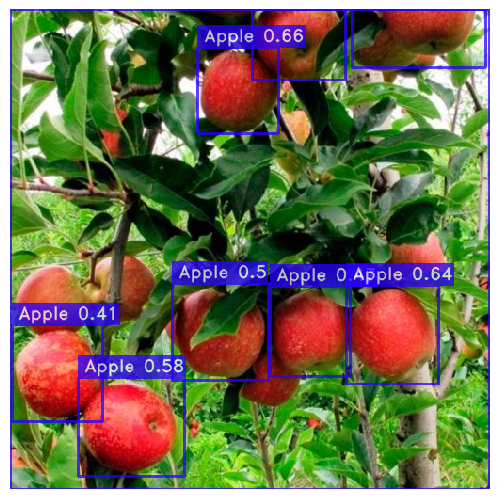

In [ ]:
url = 'https://i0.wp.com/viveiroflorabrasil.com.br/wp-content/uploads/2020/04/maca01.jpg?fit=510%2C510&ssl=1'
best_model.predict(url,  conf=0.4).show()

### Banana

[2023-12-10 00:18:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


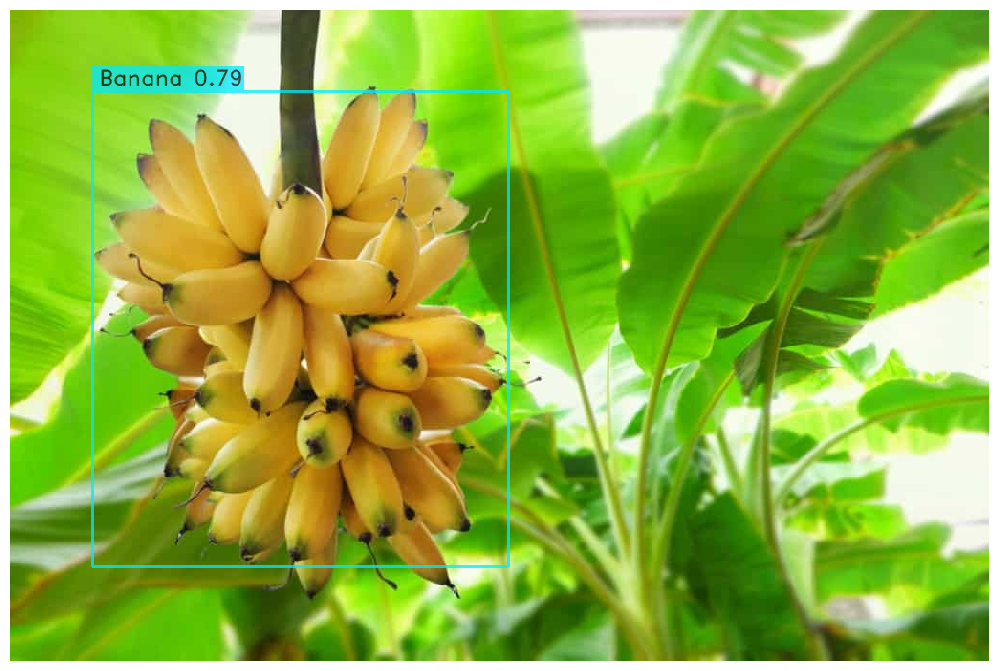

In [ ]:
url = 'https://blog4.mfrural.com.br/wp-content/uploads/2020/06/plantar-banana.jpg'
best_model.predict(url,  conf=0.51).show()

### Grape

In [ ]:
url = 'https://ocontadordecervejas.com.br/wp-content/uploads/thumbnails/quanto-tempo-leva-para-um-pe-de-uva-dar-frutos.jpg'
best_model.predict(url,  conf=0.4).show()

Output hidden; open in https://colab.research.google.com to view.

### Orange

[2023-12-10 00:22:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


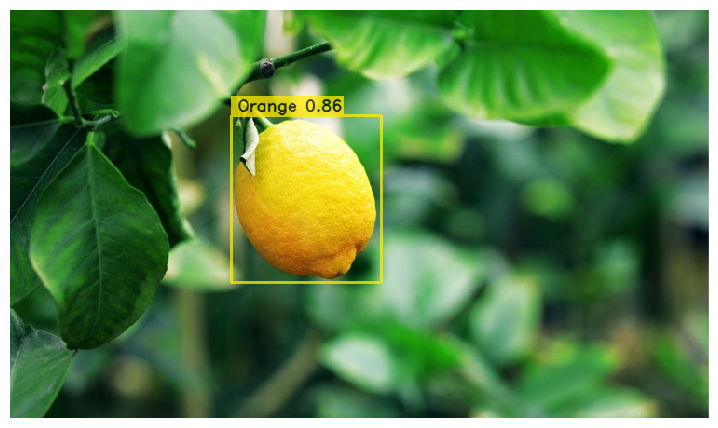

In [ ]:
url = 'https://www.nt4gbi.com/wp-content/uploads/2023/04/Como-saber-se-e-pe-de-laranja-ou-limao.jpg'
best_model.predict(url,  conf=0.51).show()

[2023-12-10 00:26:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


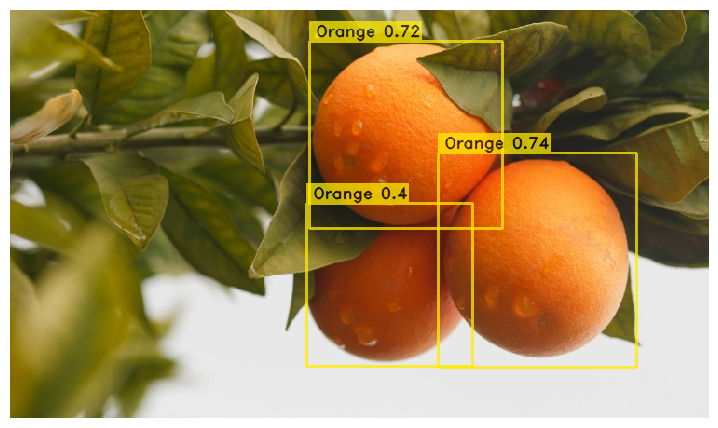

In [ ]:
url = 'https://www.nt4gbi.com/wp-content/uploads/2023/04/Quanto-tempo-leva-um-pe-de-laranja-para-dar-frutos.jpg'
best_model.predict(url, conf=0.4).show()

### Pineapple

[2023-12-10 00:26:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


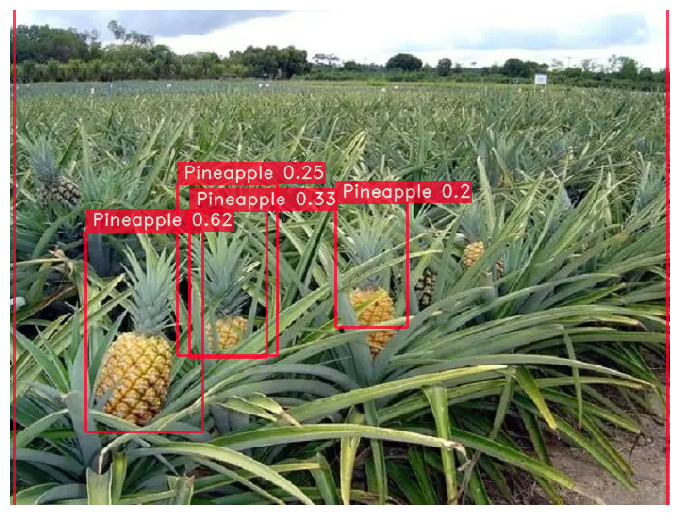

In [ ]:
url = 'https://imagens-revista.vivadecora.com.br/uploads/2021/08/Separe-um-espa%C3%A7o-no-seu-terreno-para-plantar-abacaxi.-Foto-HypeScience.jpg'
best_model.predict(url,  conf=0.2).show()

[2023-12-10 00:26:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


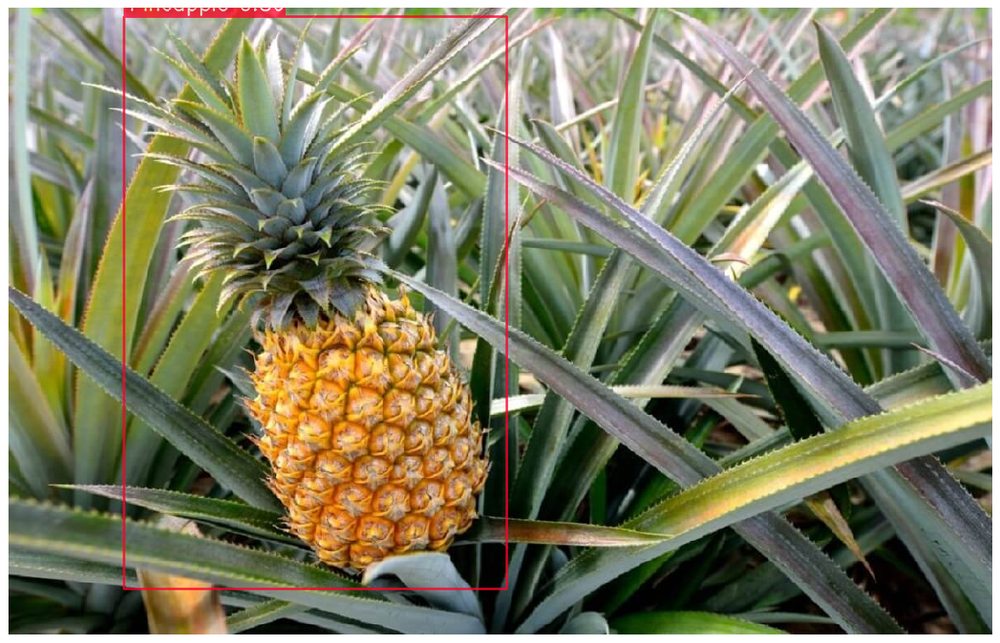

In [ ]:
url = 'https://imagens-revista.vivadecora.com.br/uploads/2021/08/Aprenda-dicas-e-truques-de-como-plantar-abacaxi-em-casa.-Foto-MF-Magazine-MF-Rural.jpg'
best_model.predict(url,  conf=0.51).show()

### Watermelon

In [ ]:
url = 'https://s2.glbimg.com/6qQci7OUTmvcCtPU5z-6KP_SAMQ=/e.glbimg.com/og/ed/f/original/2018/05/30/water-melon-1652093_1280.jpg'
best_model.predict(url,  conf=0.2).show()

Output hidden; open in https://colab.research.google.com to view.

[2023-12-10 00:46:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


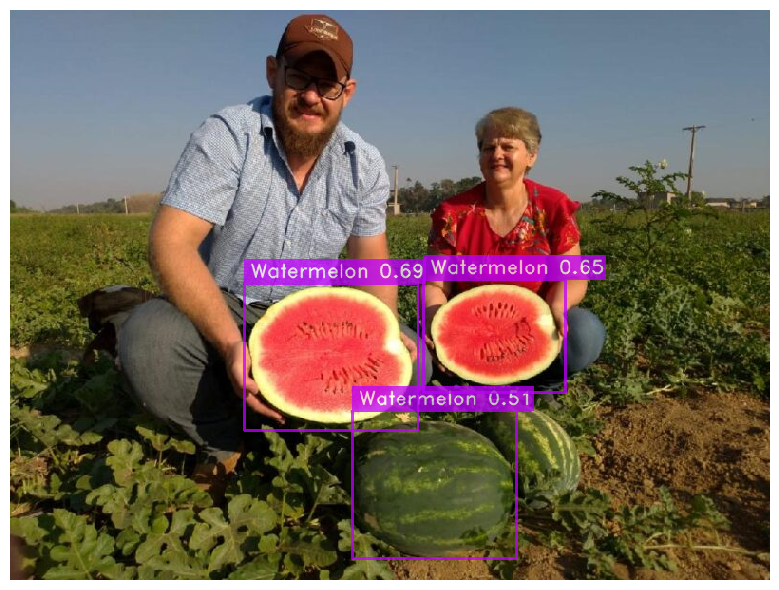

In [ ]:
url = 'https://alavoura.com.br/wp-content/uploads/2020/09/Agricultores-investem-no-cultivo-irrigado-de-melancia-como-alternativa-de-renda-no-Norte-de-MT-1-e1599056081966.jpg'
best_model.predict(url,  conf=0.4).show()

## **Salvando modelo no drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# caminho para o modelo no Colab
colab_model_path = '/content/checkpoints/fruit-detector/RUN_20231209_222601_547992/ckpt_latest.pth' #ckpt_best, ckpt_latest, average_model
# caminho para salvar o modelo no Google Drive
drive_model_path = '/content/drive/MyDrive/TCC/Pesos/Yolonas/ckpt_latest.pth'
# copiando o modelo do Colab para o Google Drive
shutil.copyfile(colab_model_path, drive_model_path)

print(f'Modelo salvo com sucesso em {drive_model_path}')

Modelo salvo com sucesso em /content/drive/MyDrive/TCC/Pesos/Yolonas/ckpt_latest.pth
